In [2]:
import layoutparser as lp
from PIL import Image
import numpy as np

In [3]:
model = lp.Detectron2LayoutModel(
            config_path ='lp://PrimaLayout/mask_rcnn_R_50_FPN_3x/config', # In model catalog
            label_map   ={1:"TextRegion", 2:"ImageRegion", 3:"TableRegion", 4:"MathsRegion", 5:"SeparatorRegion", 6:"OtherRegion"}, # In model`label_map`
            extra_config=["MODEL.ROI_HEADS.SCORE_THRESH_TEST", 0.8] # Optional
        )

The checkpoint state_dict contains keys that are not used by the model:
  pixel_mean
  pixel_std
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


In [13]:
im = Image.open('./test_set/00001300.tif')

layout = model.detect(im)

In [14]:
text_blocks = lp.Layout([b for b in layout if b.type=='TextRegion'])
figure_blocks = lp.Layout([b for b in layout if b.type=='ImageRegion'])

text_blocks = lp.Layout([b for b in text_blocks if not any(b.is_in(b_fig) for b_fig in figure_blocks)])

arr_im = np.asarray(im)

height, width = arr_im.shape[:2]

text_blocks.sort(key = lambda b:b.coordinates[0], inplace=True)

intervals = []

for i in range(len(text_blocks)):
    x_1 = text_blocks[i].block.x_1
    if i == 0:
        intervals.append(x_1)
        curr_x = x_1
    else:
        if (x_1 - curr_x) >= 500:
            intervals.append(x_1)
            curr_x = x_1  

blocks = []

for i in range(len(intervals)):
    if i == len(intervals) - 1:
        curr_interval = lp.Interval(intervals[i],width, axis='x').put_on_canvas(im)
    else:
        curr_interval = lp.Interval(intervals[i], intervals[i+1], axis='x').put_on_canvas(im)
    block = text_blocks.filter_by(curr_interval, center=True)
    block.sort(key = lambda b:b.coordinates[1], inplace=True)
    blocks.append(block)

bl = blocks[0]
for i in range(1,len(blocks)):
    bl += blocks[i]

text_blocks = lp.Layout([b.set(id = idx) for idx, b in enumerate(bl)])    

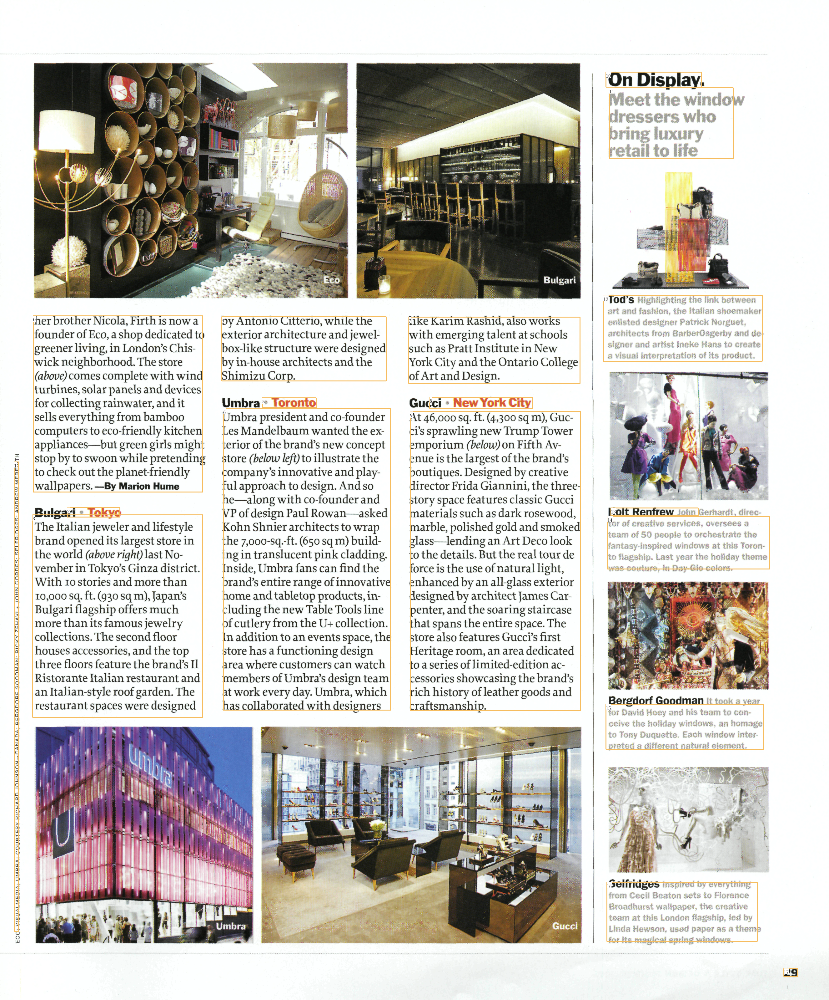

In [15]:
lp.draw_box(im, text_blocks,
            box_width=3, 
            show_element_id=True)